### Loading Libraries

In [304]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import pygal
warnings.filterwarnings('ignore')
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
from scipy.stats import spearmanr
#Data Encoding and model selection
from sklearn.preprocessing import LabelEncoder
from sklearn import model_selection
from sklearn.model_selection import train_test_split
#Used Models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
#Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import math

<b> <font size ='5'>1. A Quick Look At the Data</font></b>

In [2]:
df = pd.read_csv('candy-data.csv')
df_2 = df.copy()
df.head(4)

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,hard,bar,pluribus,sugarpercent,pricepercent,winpercent
0,100 grand,1,0,1,0,0,1,0,1,0,0.732,0.860,66.971725
1,3 musketeers,1,0,0,0,1,0,0,1,0,0.604,0.511,67.602936
2,one dime,0,0,0,0,0,0,0,0,0,0.011,0.116,32.261086
3,one quarter,0,0,0,0,0,0,0,0,0,0.011,0.511,46.116505


<li>The data consists of information about 85 candy brands. Each candy is featured by 4 taste related and 5 appereance_physical properties.</li>
<li> Each column contains binary values indicating the existence of the ingredient in the candy </li>
<li> The target variable is win percent, it represents the overall win percentage according </li>
<li> The pricepercent represents unit price percentile compared to the rest of the set. </li>

In [3]:
df.describe().T[['count','mean','min','max','75%']]

,count,mean,min,max,75%
chocolate,85.0,0.435294,0.000000,1.00000,1.000000
fruity,85.0,0.447059,0.000000,1.00000,1.000000
caramel,85.0,0.164706,0.000000,1.00000,0.000000
peanutyalmondy,85.0,0.164706,0.000000,1.00000,0.000000
nougat,85.0,0.082353,0.000000,1.00000,0.000000
crispedricewafer,85.0,0.082353,0.000000,1.00000,0.000000
hard,85.0,0.176471,0.000000,1.00000,0.000000
bar,85.0,0.247059,0.000000,1.00000,0.000000
pluribus,85.0,0.517647,0.000000,1.00000,1.000000
sugarpercent,85.0,0.478647,0.011000,0.98800,0.732000


In [4]:
df.isnull().sum()

competitorname      0
chocolate           0
fruity              0
caramel             0
peanutyalmondy      0
nougat              0
crispedricewafer    0
hard                0
bar                 0
pluribus            0
sugarpercent        0
pricepercent        0
winpercent          0
dtype: int64

In [5]:
datax = df.iloc[:,1:7]
s = datax.sum(axis=0,numeric_only=True)
s = pd.DataFrame({'taste': s.index,'count':s.values})
s

,taste,count
0,chocolate,37
1,fruity,38
2,caramel,14
3,peanutyalmondy,14
4,nougat,7
5,crispedricewafer,7


<lu> <b>Observations:</b></lu>
<br></br><br>
<li> The feature values are scaled in [0,1] range </li>
<li> Chocolate and fruity are the most used tastes </li>
<li> More than 75% of the records have a winning percentage of 60%</li>
<li> The data comes with no missing values</li>
<hr>

<b>1.2 Check The distribution of Continuious variables</b>

<p><b>How is the data distributed?</b></p>
<p>The distplot represents the univariate distribution of data i.e. data distribution of a variable against the density distribution.</p>

In [6]:
sns.set_style("dark")

<h4> Task:</h4>
<p> Create the following distplots </P>

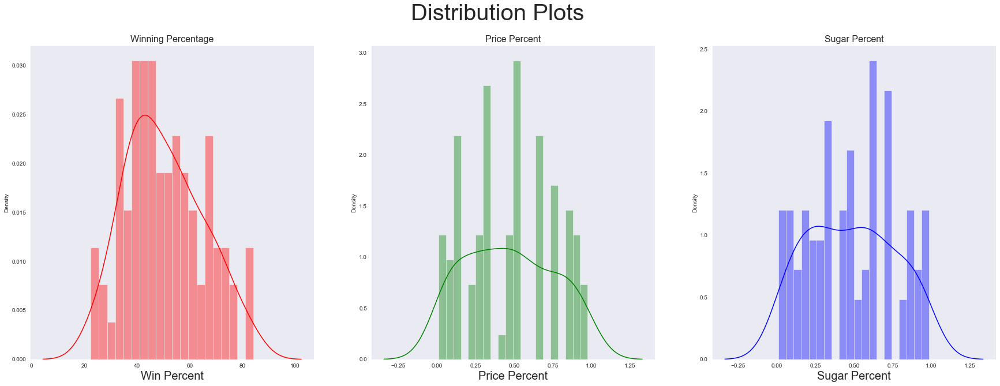

In [7]:
plt.figure(figsize=(30,10))

plt.suptitle("Distribution Plots", fontsize=40)

plt.subplot(1,3,1)
plt.title("Winning Percentage",fontsize=16)
sns.distplot(df['winpercent'], bins=20, color = 'red')
plt.xlabel("Win Percent", fontsize = 20)

plt.subplot(1,3,3)
plt.title("Sugar Percent",fontsize=16)
sns.distplot(df['sugarpercent'], bins=20, color = 'blue')
plt.xlabel("Sugar Percent", fontsize = 20)

plt.subplot(1,3,2)
plt.title("Price Percent",fontsize=16)
sns.distplot(df['pricepercent'], bins=20, color = 'green')
plt.xlabel("Price Percent", fontsize = 20)

plt.show()

<b> <font size ='5'>2. Obervations and Feature Analysis</font></b>

<b>2.1 Correlations</b>

<p> Instead of using a correlation map for all the features, use sub-correlation maps for each category</p>
<p> Taste Correlation, Format Correlation..</p>

In [8]:
taste = df.iloc[:,1:7].columns
shape_candy = df.iloc[:,7::].columns

<AxesSubplot:>

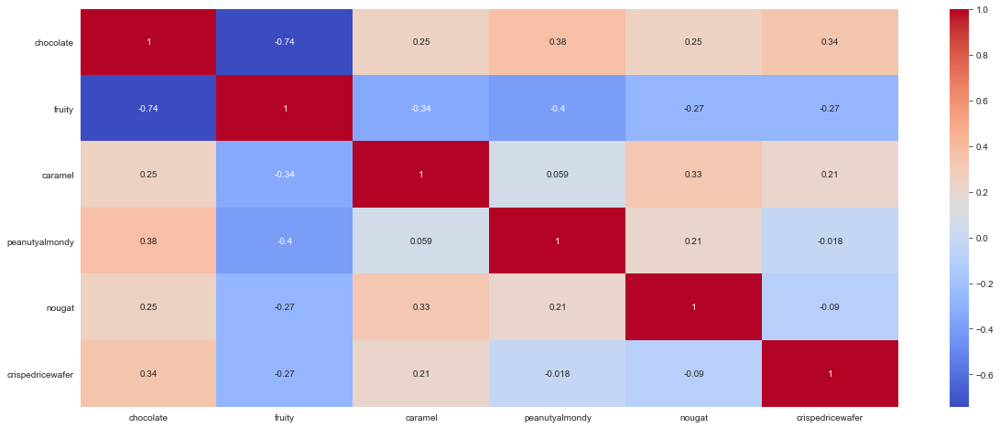

In [9]:
#physical property correlation:
plt.figure(figsize = (20,8))        
sns.heatmap(df.loc[:,taste].corr(),annot=True, cmap = 'coolwarm')

<b>The HeatMap above shows:</b>
<hr>
<lu>
    <li>Makers do not mix chocolate and fruits most of the time</li>
<li>Candies wihch are shaped as bar generally has chocolate and/or nougat and they are least likely to be in a bag and have fruits</li>
<li>Chocolate means win (mostly) sugar doesn't have a considerable effect on winning</li>

<AxesSubplot:>

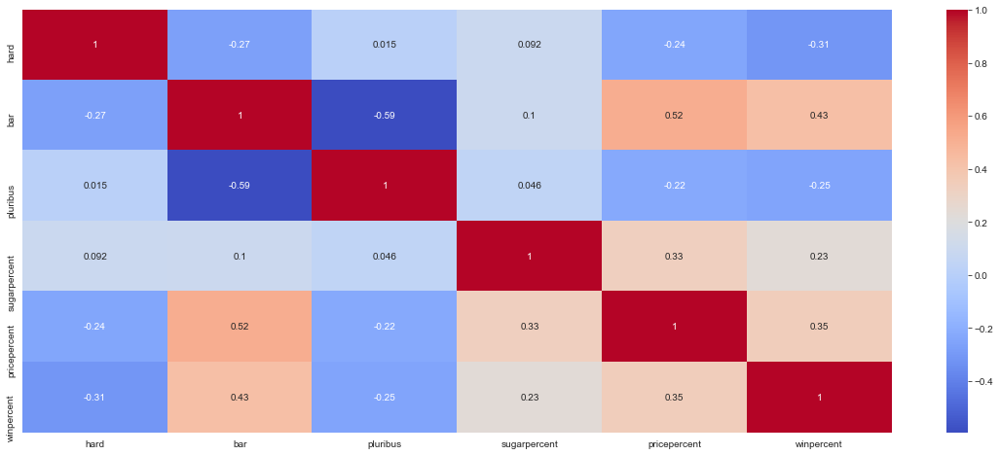

In [10]:
#physical property correlation:
plt.figure(figsize = (20,8))        
sns.heatmap(df.loc[:,shape_candy].corr(),annot=True, cmap = 'coolwarm')

<b>The HeatMap above shows:</b>
<hr>
<li>Nougat can not be Hard (negative correlation) or a crispy or rice wafer can not be hard.
<li>Packaging in bags(pluribus) is only positively correlated with hard candies. 
<li>Soft candies are packed mostly in box packages.

In [11]:
df[['chocolate', 'peanutyalmondy', 'competitorname']].groupby(['chocolate', 'peanutyalmondy'], as_index=False).count()

,chocolate,peanutyalmondy,competitorname
0,0,0,46
1,0,1,2
2,1,0,25
3,1,1,12


<b> 2.2 Composition of top winning candies </b>

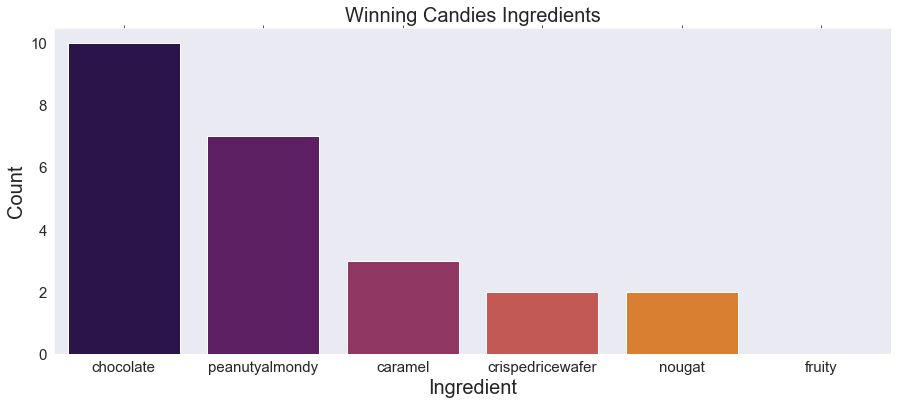

In [12]:
win_p = df.sort_values(by=['winpercent'], ascending=False)[taste.values][:10]
p = win_p[win_p==1].count().sort_values(ascending= False)
p = pd.DataFrame({'taste':p.index,'count':p.values})
plt.figure(figsize=(15,6))
b = sns.barplot(data=p, x="taste", y="count", palette="inferno")
b.axes.set_title("Winning Candies Ingredients",fontsize=20)
b.set_xlabel("Ingredient",fontsize=20)
b.set_ylabel("Count",fontsize=20)
b.tick_params(labelsize=15, top = 10)
plt.show()

All top voted ten candies has chocolate as their ingredient

In [13]:
top_candies_sugary= df_2.sort_values(by='sugarpercent',ascending=False)
top_candies_sugary.pricepercent.mean()*100

46.888235249411764

Candies that contain a high percentage of sugar are not mostly pricely

<b><font size ='3'> Study of chocolate feature </b>

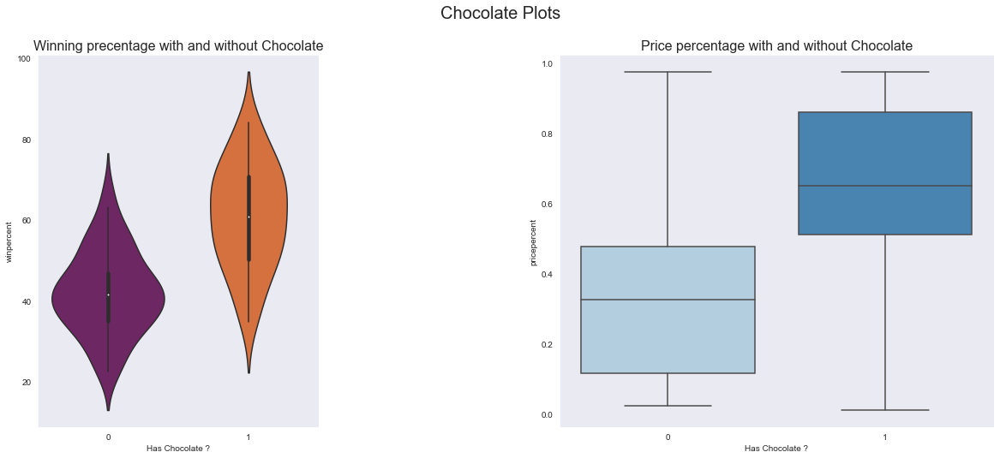

In [14]:
fig = plt.figure(figsize=(10,8))
plt.suptitle("Chocolate Plots", fontsize=20)

plt.subplot(1,3,1)
plt.title("Winning precentage with and without Chocolate",fontsize=16)
sns.violinplot(data=df,x="chocolate",y="winpercent",color="brown",palette="inferno")
plt.xlabel("Has Chocolate ?")


plt.subplot(1,2,2)
plt.title("Price percentage with and without Chocolate",fontsize=16)
sns.boxplot(y="pricepercent", x="chocolate", data=df, palette="Blues")
plt.xlabel("Has Chocolate ?")
fig.subplots_adjust(wspace=0.2)
fig.set_figheight(8)
fig.set_figwidth(20)
plt.show()

In [15]:
def map_type(x,y,z):
    if x == 1:
        return("hard")
    elif y==1:
        return ("bar")
    elif z == 1:
        return("pluribus")
    elif ((x==0) and (y == 0) and (z == 0)) or ((x == 1) and (y == 1) and (z ==1)) :
        return('Other')
df['type'] = df[['hard','bar','pluribus']].apply(lambda x: map_type(x['hard'],x['bar'],x['pluribus']) , axis=1)
df.drop(columns = ['hard','bar','pluribus'], inplace = True)

In [16]:
#sns.countplot(x=df['type'][df['chocolate']==1])
#plt.title("type of candy")
temp = df[['type']][df['chocolate'] == 1].value_counts().reset_index()
temp.rename(columns = {0:'counts'}, inplace = True)

In [17]:
temp.pivot(columns='type', values='counts').iplot(
        kind='bar',
        xTitle = 'Format',
        yTitle='Count',
        title='In which format does chocolate often come?')

In [18]:
t = (df[df['chocolate']==1].sort_values(by='winpercent', ascending = False).iloc[:,2:7]==1).sum().sort_values(ascending=False)
t = pd.DataFrame({'taste':t.index,'count':t.values})

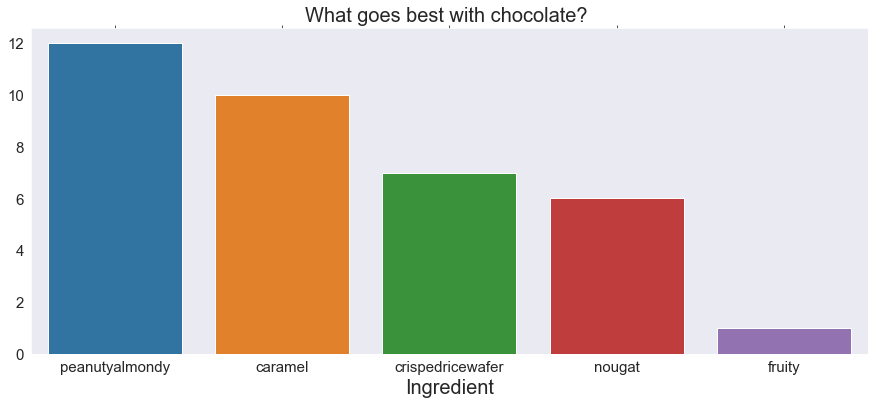

In [19]:
plt.figure(figsize=(15,6))
b = sns.barplot(data = t, x='taste', y ='count')
b.axes.set_title("What goes best with chocolate? ",fontsize=20)
b.set_xlabel("Ingredient",fontsize=20)
b.set_ylabel("",fontsize=20)
b.tick_params(labelsize=15, top = 10)
plt.show()

In [20]:
sweeter = df[['sugarpercent','pricepercent','winpercent']][df['chocolate']==1].sort_values(by=['winpercent'], ascending=False)[df['sugarpercent']>df['sugarpercent'].quantile(.6)].head(10)

In [21]:
bitter = df[['sugarpercent','pricepercent','winpercent']][df['chocolate']==1].sort_values(by=['winpercent'], ascending=False)[df['sugarpercent']<df['sugarpercent'].quantile(.5)].head(10)

In [22]:
win_chocolate = pd.DataFrame({'type':['sweet','bit'],'percentage':[sweeter['winpercent'].sum()/len(sweeter),bitter['winpercent'].sum()/len(bitter)]})

In [23]:
win_chocolate

,type,percentage
0,sweet,70.358731
1,bit,64.421041


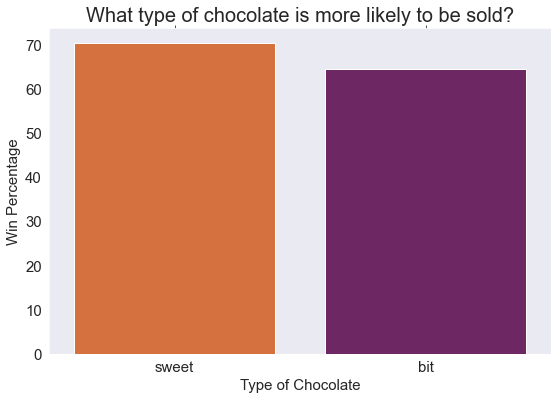

In [24]:
plt.figure(figsize=(9,6))
b = sns.barplot(data = win_chocolate, x = 'type', y = 'percentage', palette='inferno_r')
b.axes.set_title("What type of chocolate is more likely to be sold?",fontsize=20)
b.set_xlabel("Type of Chocolate",fontsize=15)
b.set_ylabel("Win Percentage",fontsize=15)
b.tick_params(labelsize=15, top = 10)
plt.show()

<p>Chocolate and peanutyalmondy make a good mix together. We can see that they have a huge influence on the winning percentage
which makes them on top of other ingredients. </p>

<lu> <b>Interpretations of the above results: </b></lu>
<hr>
<li>Having chocolate in the candy would give a high win percentage, followed by being a bar candy and having peanuts/peanut butter/almonds.</li>
<li>Chocolate or nougat in the candy would usually come in the form of a bar as opposed to pluribus candies.</li>
<li>Chocolate would be an expensive candy, while fruity candies would be less expensive.</li>
<li>Fruity candies, as compared to the others, are more likely to be a hard candy.</li>
<li>Chocolate are not usually found in fruity candies.</li>
<li>Sweet chocolate candies are more probable to be bought than for instance bitter chocolate candies.</li>

<b><font size ='3'> Study of other features </b>

In [25]:
df[['chocolate', 'fruity', 'competitorname']].groupby(['chocolate', 'fruity'], as_index=False).count()

,chocolate,fruity,competitorname
0,0,0,11
1,0,1,37
2,1,0,36
3,1,1,1


1) Among the tastes, Chocolate is the most effective component which affects the popularity (see bar plot of the correlation ratio).

2) Among the tastes, Fruity goes in a completly different direction as others.

3) For chocolate candies, the more pricey they are, the more likely they sell!

4) For fruity candies the popularity increases as their price decrases. In other words the cheapest one sell best!

5) Sugar amount is independent of the ingredients (see correlation ratio plot).

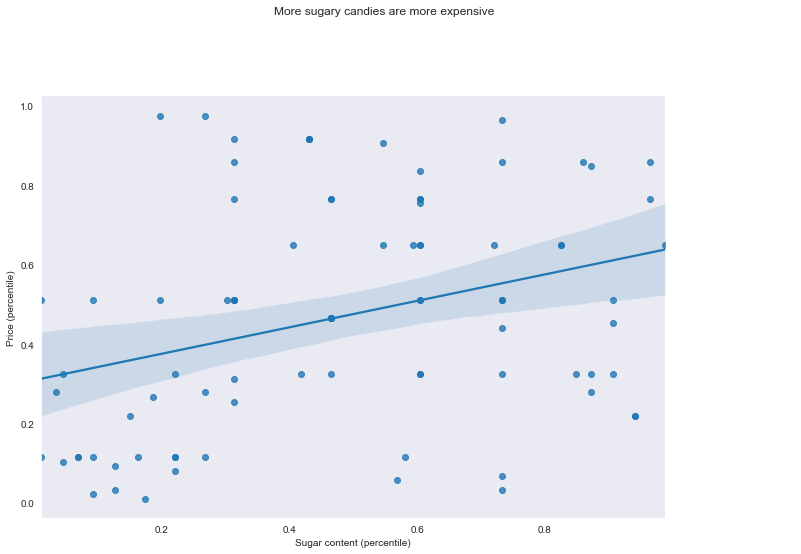

In [26]:
import seaborn as sns
g = sns.JointGrid(x="sugarpercent", y="pricepercent", data=df,
                  )
g.plot_joint(sns.regplot)
g.fig.set_figwidth(12)
g.fig.set_figheight(8)
g.fig.suptitle('More sugary candies are more expensive')
g.set_axis_labels('Sugar content (percentile)', 'Price (percentile)')
g.ax_marg_x.set_axis_off()
g.ax_marg_y.set_axis_off()


The x-axes representing sugar content and the y-axis representing the price. Each individual candy is showing using a single point. The position of the point is determined by the value of the sugarpercent and pricepercent column for that candy.

The blue line on the plot represents the linear function we've fitted and shows that there is a relationship between how much sugar is in a candy and how expensive it is: in general, candy with more sugar is more expensive

The shade behind the line is the confidence interval for this function. It outlines the area that should contain the line which represents the true function 95% of the time.

In [27]:
df_bis = pd.DataFrame({'win': df['winpercent']/100,'sugar': df['sugarpercent']}).dropna()
df_bis.corr()

,win,sugar
win,1.000000,0.229151
sugar,0.229151,1.000000


A correlation of 0.22 seems to indicate a positive correlation between our two variables. In other words, the more sugar, the more wins (which is not very surprising!).

In [28]:
df_bis['morewin'] = (df_bis['win'] > df_bis['win'].median())
df_bis['moresugar'] = (df_bis['sugar'] > df_bis['sugar'].median())
#df_bis
df_bis[(df_bis['morewin']==True)& (df_bis['moresugar']==True)].head(4)

,win,sugar,morewin,moresugar
0,0.669717,0.732,True,True
1,0.676029,0.604,True,True
4,0.523415,0.906,True,True
6,0.569145,0.604,True,True


In [305]:
from pylab import rcParams


## set output formatnp.set_printoptions(precision=3)
np.set_printoptions(suppress=True)


# Define the figure size
rcParams['figure.figsize'] = 8 , 8
rcParams['axes.linewidth'] = 1.8
#
header_array = data_org.columns


def org_plot(data_org) :
    global header_array
    sns.distplot( data_org["winpercent"] , hist=True )
    #plt.savefig( "win-hist.png" , dpi = 300   )
    #plt.clf()
    
    #    
#    
    ################################################################################
    #### plot of the original data
    ##################################################################################
    for header_name in header_array[1:10]  : 
        sns.relplot( x="pricepercent", y="winpercent", hue= header_name , style = header_name , data=data_org  );      
        sns.set( font_scale=1.6 )
#       plt.legend(loc='upper left')
        #plt.savefig( header_name+".png" , dpi = 300   )
        #plt.clf()   
#    
    
    
     ## plot the joint figure of suger or pricecpercent with regarding to the winpercent
    for header_name in header_array[10:12]  : 
    #    fig = sns.relplot( x="pricepercent", y="winpercent", hue= header_name , style = header_name , data=data_org); 
        fig = sns.jointplot( x=header_name, y="winpercent", data=data_org, kind="kde", color="m")
        sns.set( font_scale=1.6 )
        fig.plot_joint(plt.scatter, c="w", marker="+"); 
        fig.ax_joint.collections[0].set_alpha(0)
        #plt.savefig( header_name+"_dist.png" , dpi = 300  , bbox_inches='tight'  )
        #plt.clf()    
    

    ###############################################################################
    #### conclusion: chocolate, fruity, hard---apparent influence, others not so apparent.
    ###  chocolate and fruity does not appear at the same time, expect "Tootsie Pop". Or they both don't appear at all.            
    ###  hard and bar does not appear at the same time. Or they both don't appear at all.            
    ###  nougut and crispedricewafer does not appear at the same time. Or they both don't appear at all.            
    ###  fruity and caramel does not appear at the same time, expect "Caramel Apple Pops". Or they both don't appear at all.            
    ###############################################################################


#
##############################################################################
## load the data
##############################################################################
## the header name 
## competitorname	chocolate	fruity	caramel	peanutyalmondy	nougat	crispedricewafer	hard	bar	pluribus	sugarpercent	pricepercent	winpercent

## load the data
data_org = df
data_org = data_org.sort_values( by = "winpercent"  )
data_org["winpercent"] = data_org["winpercent"] / 100.0
### header 
## plot orginal distribution


########################################################################



#######################################################################


In [308]:
header_array = data_org.columns


,competitorname,sugarpercent,pricepercent,winpercent,type,mix,encoded_type,encoded_mix
44,nik l nip,0.197,0.976,0.224453,pluribus,fruity,3,11
7,boston baked beans,0.313,0.511,0.234178,pluribus,peanutyalmondy,3,13
12,chiclets,0.046,0.325,0.245250,pluribus,fruity,3,11
72,super bubble,0.162,0.116,0.273039,Other,fruity,0,11
26,jawbusters,0.093,0.511,0.281274,hard,fruity,2,11
...,...,...,...,...,...,...,...,...
64,snickers,0.546,0.651,0.766738,bar,chocolate+caramel+peanutyalmondy+nougat,1,6
28,kit kat,0.313,0.511,0.767686,bar,chocolate+crispedricewafer,1,7
79,twix,0.546,0.906,0.816429,bar,chocolate+caramel+crispedricewafer,1,3
51,reeses miniatures,0.034,0.279,0.818663,Other,chocolate+peanutyalmondy,0,10


<b> <font size ='5'>2. Predictive Modelling</font></b>

<h4>2.1 Transforming the data</h4>

<b> Columns that have a null value in all taste </b>

In [31]:
df[df[taste.values].apply(lambda x: min(x) == max(x), 1)]

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,sugarpercent,pricepercent,winpercent,type
2,one dime,0,0,0,0,0,0,0.011,0.116,32.261086,Other
3,one quarter,0,0,0,0,0,0,0.011,0.511,46.116505,Other
8,candy corn,0,0,0,0,0,0,0.906,0.325,38.010963,pluribus
19,haribo happy cola,0,0,0,0,0,0,0.465,0.465,34.158958,pluribus
48,pixie sticks,0,0,0,0,0,0,0.093,0.023,37.722336,pluribus
57,root beer barrels,0,0,0,0,0,0,0.732,0.069,29.703691,hard


<p> In order to reduce the number of features and to boost the training time, we will perform some feature preprocessing.
</p>

<h5> Reducing Features </h5>

In [32]:
df['mix'] = [0 for i in range(len(df))]
for i in range(len(df)): 
    s = df.iloc[i][taste.values]
    x = s.reset_index()
    if s.sum()!=0:
        mixed_tastes = x['index'][x[i].isin([1])].values
        df['mix'].iloc[df.index == i] = '+'.join(mixed_tastes)
    else:
        df['mix'].iloc[df.index == i] = 'unknown'

In [33]:
df.drop(columns=taste.values, inplace=True)

<h5> Label Encoding </h5>

In [36]:
LE = LabelEncoder()
df['encoded_type'] = LE.fit_transform(df['type'])
df['encoded_mix'] = LE.fit_transform(df['mix'])
new_df = df[['competitorname', 'encoded_type' , 'encoded_mix', 'sugarpercent', 'pricepercent', 'winpercent']]

In [37]:
new_df

,competitorname,encoded_type,encoded_mix,sugarpercent,pricepercent,winpercent
0,100 grand,1,3,0.732,0.860,66.971725
1,3 musketeers,1,9,0.604,0.511,67.602936
2,one dime,0,15,0.011,0.116,32.261086
3,one quarter,0,15,0.011,0.511,46.116505
4,air heads,0,11,0.906,0.511,52.341465
...,...,...,...,...,...,...
80,twizzlers,0,11,0.220,0.116,45.466282
81,warheads,2,11,0.093,0.116,39.011898
82,welchs fruit snacks,3,11,0.313,0.313,44.375519
83,werthers original caramel,2,0,0.186,0.267,41.904308


<h5> Model Training </h5>

<h5> Multiple model with a function that assembles them </h5>

### Using normal data frame

In [1351]:
#df_2['winpercent'] = df_2.winpercent/100
X = df_2.drop(columns=['competitorname','sugarpercent','pricepercent',"winpercent"])
y = df_2.winpercent
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, shuffle=True)

In [1355]:
clf = LinearRegression()
clf.fit(X_train,y_train)
predict = clf.predict(X_test)
print('MSE:',mean_squared_error(predict,y_test))
print('RMSE:', np.sqrt((predict-y_test)**2).mean())
r2_score(y_test,predict)

MSE: 0.009851471131989609
RMSE: 0.079344428136086


0.5325662795791597

In [1363]:
y_train.max()

0.8418029

In [1360]:
row = [[1],[1],[1],[1],[1],[1],[0],[1],[0]]
clf.predict(np.array(row).reshape(1,-1))

array([0.85199762])

In [ ]:
chocolate 17.395113450849347 == 1
fruity 7.720639686401811 == 1
caramel 2.9072336870698603 == 1
peanutyalmondy 9.094281846468235 == 1
nougat 1.3764952562193926 == 1
crispedricewafer 7.301821467840014 == 1
bar 0.7309590882068205 == 1

Text(0.5, 1.0, 'Linear Regression')

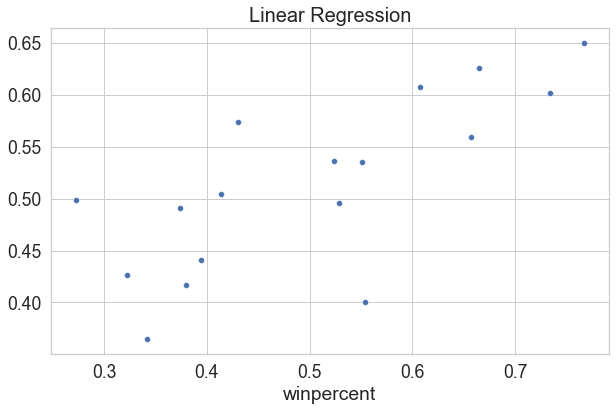

In [248]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
g = sns.scatterplot(x = y_test, y = predict)
g.axes.set_title('Linear Regression', fontsize= 20)

In [369]:
from sklearn.tree import DecisionTreeRegressor
clf1 = LinearRegression()
clf2 = DecisionTreeRegressor()
clf3 = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1,
            max_depth=1, random_state=0, loss='ls')

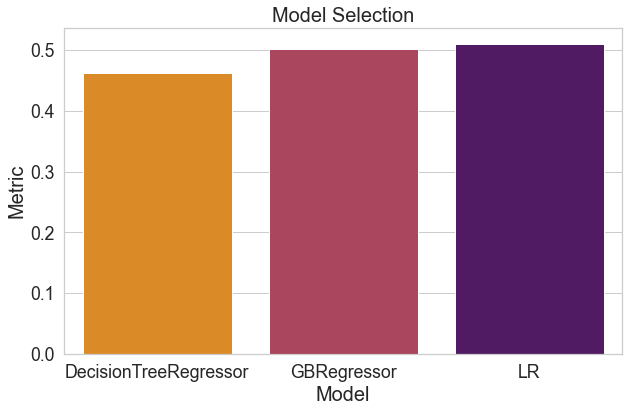

In [250]:
def model_s(metric):
    models = []
    models.append(('LR', clf1))
    models.append(('DecisionTreeRegressor', clf2))
    models.append(('GBRegressor', clf3))
    # evaluate each model in turn
    results = []
    names = []
    for name, model in models:
        model.fit(X_train, y_train)
        pred = model.predict(X_test)
        cv_results = metric(y_test, pred)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f" % (name, cv_results)
        #print(msg)
    d = pd.DataFrame({'Model': names,'Metric':results
                         })
    plt.figure(figsize=(10,6))
    ax = sns.barplot(x ='Model', y='Metric', data= d.sort_values(by='Metric'), palette='inferno_r')
    ax.axes.set_title("Model Selection",fontsize=20)
    ax.set_xlabel("Model",fontsize=20)
    ax.set_ylabel("Metric",fontsize=20)
model_s(r2_score)

### Using preprocessed data frame

In [ ]:
new_df['winpercent'] = new_df.winpercent/100


In [1339]:
X,y = new_df.drop(columns=['competitorname','pricepercent','winpercent']), new_df.winpercent
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, shuffle=True)
model = LinearRegression()
model.fit(X_train,y_train)
pred = model.predict(X_test)

In [ ]:
chocolate 17.395113450849347
fruity 7.720639686401811
caramel 2.9072336870698603
peanutyalmondy 9.094281846468235
nougat 1.3764952562193926
crispedricewafer 7.301821467840014
hard -4.442497827630216
bar 0.7309590882068205
pluribus -0.1423586756012188

In [1340]:
X_test

,encoded_type,encoded_mix,sugarpercent
64,1,6,0.546
72,0,11,0.162
50,3,11,0.581
4,0,11,0.906
41,2,11,0.848
75,0,1,0.313
71,0,0,0.418
45,3,11,0.220
56,3,2,0.860
29,0,11,0.220


In [1336]:
def reg_metrics(Y_test,Y_predicted):
    print('MSE:',mean_squared_error(Y_test, Y_predicted))
    print('RMSE:',math.sqrt(mean_squared_error(Y_test, Y_predicted)))
    print('MAE:',mean_absolute_error(Y_test, Y_predicted))
    print('R2:',abs(r2_score(Y_test, Y_predicted)))
# MSE: 2017904593.23
# RMSE: 44921.092965684235

In [1337]:
print('Metrics Using Linear Regression:')
reg_metrics(y_test,pred)

Metrics Using Linear Regression:
MSE: 2.4456582646495855e-10
RMSE: 1.5638600527699354e-05
MAE: 1.2139809139488101e-05
R2: 0.16041870925348123


In [258]:
from sklearn import neighbors
from math import sqrt
rmse_val = [] #to store rmse values for different k
for K in range(20):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(X_train, y_train)  #fit the model
    pred=model.predict(X_test) #make prediction on test set
    error = sqrt(mean_squared_error(y_test,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 0.09900295049508757
RMSE value for k=  2 is: 0.13878505174089462
RMSE value for k=  3 is: 0.12034226782619918
RMSE value for k=  4 is: 0.14202495025811818
RMSE value for k=  5 is: 0.14793770794526143
RMSE value for k=  6 is: 0.1450546771944677
RMSE value for k=  7 is: 0.14894233827898526
RMSE value for k=  8 is: 0.1524331721126794
RMSE value for k=  9 is: 0.1474340774388606
RMSE value for k=  10 is: 0.14144933857924982
RMSE value for k=  11 is: 0.13686447084369993
RMSE value for k=  12 is: 0.13278671642368628
RMSE value for k=  13 is: 0.12954360044043223
RMSE value for k=  14 is: 0.12875551460742815
RMSE value for k=  15 is: 0.12680593169508625
RMSE value for k=  16 is: 0.12489782178547283
RMSE value for k=  17 is: 0.12400256314387818
RMSE value for k=  18 is: 0.12243794741451165
RMSE value for k=  19 is: 0.1222131267964754
RMSE value for k=  20 is: 0.12190065513061478


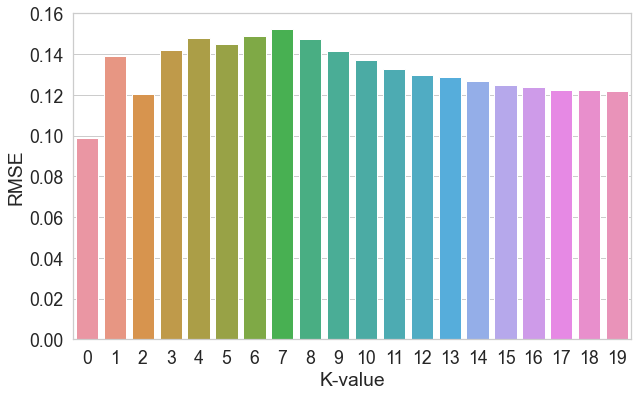

In [259]:
plt.figure(figsize=(10,6))
curve = pd.DataFrame(rmse_val).reset_index().rename(columns={'index':'K-value',0:'RMSE'}) #elbow curve 
ax = sns.barplot(x = 'K-value', y='RMSE', data = curve )

<h1> Pipeline</h1>

<b> Step 1 : Extract possible value combinations </b1>

<b> candy taste combination </b>

In [1547]:
import numpy as np
#Generating Taste combinations

x = [0, 0, 0, 0, 0, 0]
y = [1, 1, 1, 1, 1, 1]

taste_c = list()
for perm in permutations([x, y]):
    taste_c.append(perm)
    
#taste_c

<b> candy format combination </b>

In [1556]:
import numpy as np
#Generating Format combinations

x = [1,1,1]
y = [0,0,0]

format_c = list()
for perm in permutations([x, y]):
    format_c.append(perm)
    

In [1572]:
sugar_c = [i/100 for i in range(10,100)]

<b> Step 2: Find out the best possible combinations for win percentage </b>

Each time, we will fix a taste combination and then we try with all possible format sets, we then store the predicted
win percentage. We,then, pick up the best combination for the highest win percentage

In [2151]:
X,y = df_2.drop(columns=['competitorname','pricepercent','winpercent']), df_2.winpercent
#X, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, shuffle=True)

In [2152]:
model = LinearRegression()
model.fit(X,y)

LinearRegression()

In [ ]:
r2_score()

In [2153]:
pred = model.predict(X_test)

In [2156]:
mean_absolute_error(y_test,pred)

0.07824929877726415

In [2157]:
np.sqrt(mean_squared_error(y_test,pred))

0.09786276135490829

In [2154]:
r2_score(y_test, pred)

0.5455837203816316

In [1551]:
'''l = list()
for i in range(len(taste_c)):
    for j in range(len(format_c)):
        row = taste_c[i] + format_c[j]
        row = np.array(row).flatten().reshape(9,).reshape(1,-1)
        prediction = model.predict(row)
        l.append((i,j,prediction))'''

In [ ]:
r2_score()

In [1643]:
l = list()
for i in range(len(taste_c)):
    for j in range(len(format_c)):
        for k in range(len(sugar_c)):
            row = taste_c[i] + format_c[j] + [sugar_c[k]]
            row = np.array(row).flatten().reshape(10,).reshape(1,-1)
            prediction = model.predict(row)
            l.append((i,j,k,prediction))

In [1795]:
data = pd.DataFrame()
data['taste'] = [0 for i in range(len(l))]
data['shape'] = [0 for i in range(len(l))]
data['sugar'] = [0 for i in range(len(l))]
data['win'] = [0 for i in range(len(l))]
    #sugar_amount = l[0][2]
    #win_p_ = l[0][3]

In [1796]:
for b in range(len(l)):
    if l[b][3] > df_2.winpercent.max():
        data['sugar'].iloc[data['sugar'].index==b] = sugar_c[l[b][2]]
        data['win'].iloc[data['win'].index==b] = l[b][3]
        data['taste'].iloc[data['taste'].index==b] = str(taste_c[l[b][0]])
        data['shape'].iloc[data['shape'].index==b] = str(format_c[l[b][1]])
        #dfm.loc[(dfm['jolie'] == 1) , 'jolie'] = dfm.loc[(dfm['jolie'] == 1) ,'folie']


In [1828]:
from scipy.stats import mode
new_data = data[data['win']!=0.0]
mode(new_data)

ModeResult(mode=array([['[1, 1, 1, 1, 1, 1]', '[0, 0, 0]', 0.97, 0.8418190137631644]],
      dtype=object), count=array([[347, 279,  19,   1]]))

In [2172]:
new_data.sugar.median()

0.72

In [2173]:
row_2 = [1, 1, 1, 1, 1, 1,0,0,0,new_data['sugar'].median()]
model.predict(np.array(row_2).reshape(1,-1))

array([0.86652979])

In [2174]:
max_value = 0
ind = 0
for i in range(len(l)):
    for n in l[i][3]:
        if n > max_value: 
            max_value = n;ind = i

(0.6, 0.9604438254662706)

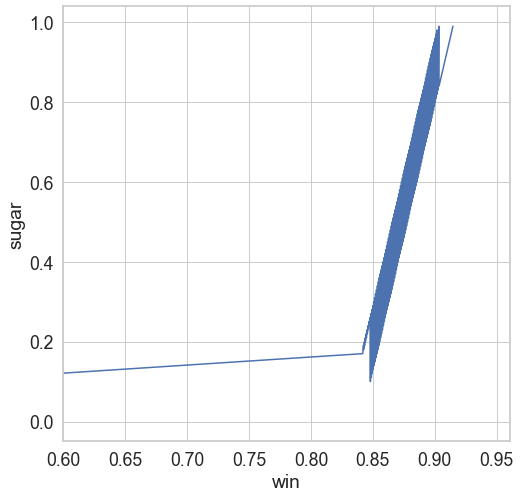

In [1734]:
sns.lineplot(x='win',y='sugar',data=data)
plt.xlim(0.6)

### Dash product
<p> A dash product that takes as input the ingredients and sugar percent and tries to predict the win percent </p>

In [1999]:
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.express as px
import pandas as pd

## import dash
import dash_core_components as dcc
import dash_html_components as html 
from dash.dependencies import Input, Output
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px

In [2137]:
app = dash.Dash(__name__)
app.layout = html.Div([
    #First Inside Div
    html.Div(
    [  
    html.H1('Candy Win % Predictor', 
    style={'margin-bottom':'10px','text-align':'center', 'color': 'rgb(134, 188, 37)', 'fontSize': 40}),
    ]),
    #Second Inside Div
    html.Div(
    [  
    html.H1('Select Sugar Percent:', 
    style={'text-align':'left', 'margin' : 20,'fontSize': 25}),
    
    dcc.Slider(
        id='sugar-value',
        min=0,
        max=90,
        step=1,
        value = 50,
    ),  html.Div(id ='sugar')   ]),
    
    #Third Inside Div
    html.Div(
    [  
    html.H1('Select Ingredients:', 
    style={'text-align':'left', 'margin' : 20,'fontSize': 25}),]),
    
    #Fourth Inside Div
    html.Div(
    [ 
    html.H5('Does it contain Chocolate?',
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),
    dcc.RadioItems(
    id ='choco',
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    value = 0,
    style={'text-align':'left', 'margin' : 30,'fontSize': 15, 'margin-top':'-11px'},
    labelStyle={'display': 'inline-block','margin-right':'15px', 'fontSize':18}
),html.Div(id ='chocolate')]),
    
#Fifth Inside Div
    html.Div(
    [ 
    html.H5('Does it contain Fruits?', 
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),
    dcc.RadioItems(
    id ='fruity',
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    style={'text-align':'left', 'margin' : 30,'fontSize': 15, 'margin-top':'-11px'},
    labelStyle={'display': 'inline-block','margin-right':'15px', 'fontSize':18}
), html.Div(id ='fruits')]),
    
#Sixth Inside Div
    html.Div(
    [ 
    html.H5('Does it contain Caramel?', 
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),
    dcc.RadioItems(
    id ='caramell',
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    style={'text-align':'left', 'margin' : 30,'fontSize': 15, 'margin-top':'-11px'},
    labelStyle={'display': 'inline-block','margin-right':'15px', 'fontSize':18}
), html.Div(id ='caramel')]),
    
    #Seventh Inside Div
    html.Div(
    [ 
    html.H5('Does it contain Peanuty Almondy?', 
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),
    dcc.RadioItems(
    id ='penautyy',
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    style={'text-align':'left', 'margin' : 30,'fontSize': 15, 'margin-top':'-11px'},
    labelStyle={'display': 'inline-block','margin-right':'15px', 'fontSize':18}
), html.Div(id ='penaut')]),
    
    #8th Inside Div
    html.Div(
    [ 
    html.H5('Does it contain Nougat?', 
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),
    dcc.RadioItems(
    id ='nougatt',
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    style={'text-align':'left', 'margin' : 30,'fontSize': 15, 'margin-top':'-11px'},
    labelStyle={'display': 'inline-block','margin-right':'15px', 'fontSize':18}
), html.Div(id ='nougat')]),
    
     #9th Inside Div
    html.Div(
    [ 
    html.H5('Does it contain Crisped Rice?', 
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),
    dcc.RadioItems(
    id = 'crispedd',
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    style={'text-align':'left', 'margin' : 30,'fontSize': 15, 'margin-top':'-11px'},
    labelStyle={'display': 'inline-block','margin-right':'15px', 'fontSize':18}
), html.Div(id ='crisped')]),
     #10th Inside Div
    #Moved
    ################################
    html.Div(
    [  
    html.H1('Select Shape:', 
    style={'text-align':'left', 'margin' : 20,'fontSize': 25}),]),
    
    #Hard Inside Div
    html.Div(
    [ 
    html.H5('Is it Hard?',
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),
    dcc.RadioItems(
    id ='hard',
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    value = 0,
    style={'text-align':'left', 'margin' : 30,'fontSize': 15, 'margin-top':'-11px'},
    labelStyle={'display': 'inline-block','margin-right':'15px', 'fontSize':18}
),html.Div(id ='hd')]),
   #Bar Inside Div
    html.Div(
    [ 
    html.H5('Is it Bar?',
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),
    dcc.RadioItems(
    id ='bar',
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    value = 0,
    style={'text-align':'left', 'margin' : 30,'fontSize': 15, 'margin-top':'-11px'},
    labelStyle={'display': 'inline-block','margin-right':'15px', 'fontSize':18}
),html.Div(id ='br')]),
    ###########
    html.Div(
    [ 
    html.H5('Is it Pluribus?',
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),
    dcc.RadioItems(
    id ='pluri',
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    value = 0,
    style={'text-align':'left', 'margin' : 30,'fontSize': 15, 'margin-top':'-11px'},
    labelStyle={'display': 'inline-block','margin-right':'15px', 'fontSize':18}
),html.Div(id ='pl')]),
    html.Div(
    [ 
    html.H5('Results', 
    style={'text-align':'left', 'margin' : 30,'fontSize': 15}),html.Div(id ='results')]),
    
    
    #####Financial Aspects Part
    html.Div(
    [  
    html.H1('Financial Aspects Calculator', 
    style={'margin-bottom':'10px','text-align':'center', 'color': 'rgb(134, 188, 37)', 'fontSize': 40}),
    ]),
    #####
    html.Div(
    [  
    html.H5('Win %:', 
    style={'text-align':'left', 'margin' : 0,'fontSize': 15}),
    
   dcc.Input(
        id='win_p',
        type = 'number'
    ), html.Hr() ]),
    #####
    html.Div(
    [  
    html.H5('Expected sales per month:', 
    style={'text-align':'left', 'margin' : 0,'fontSize': 15}),
    
    dcc.Input(
        id='sales_month',
        type = 'number'
    ), html.Hr()]),

#####
    html.Div(
    [  
    html.H5('Win per candy:', 
    style={'text-align':'left', 'margin' : 0,'fontSize': 15}),
    
    dcc.Input(
        id='win_candy',
        type = 'number'
    ), html.Hr()   ]),
    #####
    html.Div(
    [  
    html.H5('Number of locations for selling:', 
    style={'text-align':'left', 'margin' : 0,'fontSize': 15}),
    
    dcc.Input(
        id='locations',
        type = 'number'
    ), html.Div(id='r') ]),
])


@app.callback(Output('sugar','children'),
    Input('sugar-value','value'))
def update_sugar(value):
    return "You have selected : {}".format(value)



@app.callback(Output('results','children'),
    Input('choco','value'),
    Input('fruity','value'),
    Input('caramell','value'),
    Input('penautyy','value',),
       Input('nougatt','value',),
            Input('crispedd','value'),
             Input('hard','value'),
             Input('bar','value'),
             Input('pluri','value'),
                 Input('sugar-value','value'))
def update_value(ch,f,ca,p,n,cr,hard,bar,pluri,sugar):
    row_p = [ch] + [f] + [ca] + [p] + [n] + [cr] + [hard] + [bar] + [pluri] + [sugar/100]
    prediction = model.predict(np.array(row_p).reshape(1,-1))
    return "Your estimated win % is: {}".format(str(prediction))


@app.callback(Output('r','children'),
    Input('win_p','value'),
             Input('win_candy','value'),
             Input('locations','value'),
             Input('sales_month','value'))
def update_financial(a,b,c,d):
    return "Expected Win Value in €: {}".format(a*b*c*d)


if __name__ =='__main__':
    app.run_server(debug=False)

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is run

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/



INFO:__main__:Dash is running on http://127.0.0.1:8050/



 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off
Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*args, outputs_list

ERROR:__main__:Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.9/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.9/site-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/usr/local/lib/python3.9/site-packages/dash/dash.py", line 1078, in dispatch
    response.set_data(func(*arg

In [2104]:
df_2

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,hard,bar,pluribus,sugarpercent,pricepercent,winpercent
0,100 grand,1,0,1,0,0,1,0,1,0,0.732,0.860,0.669717
1,3 musketeers,1,0,0,0,1,0,0,1,0,0.604,0.511,0.676029
2,one dime,0,0,0,0,0,0,0,0,0,0.011,0.116,0.322611
3,one quarter,0,0,0,0,0,0,0,0,0,0.011,0.511,0.461165
4,air heads,0,1,0,0,0,0,0,0,0,0.906,0.511,0.523415
...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,twizzlers,0,1,0,0,0,0,0,0,0,0.220,0.116,0.454663
81,warheads,0,1,0,0,0,0,1,0,0,0.093,0.116,0.390119
82,welchs fruit snacks,0,1,0,0,0,0,0,0,1,0.313,0.313,0.443755
83,werthers original caramel,0,0,1,0,0,0,1,0,0,0.186,0.267,0.419043


In [1995]:
    dcc.RadioItems(
    html.H3('Does it contain Chocolate?'),
    options=[
        {'label': 'True', 'value': 1},
        {'label': 'False', 'value': 0},
    ],
    value='MTL',
    labelStyle={'display': 'inline-block'}
)

0.47829754

In [ ]:
import dash_bootstrap_components as dbc

inline_radioitems = dbc.FormGroup(
    [
        dbc.Label("Choose one"),
        dbc.RadioItems(
            options=[
                {"label": "Option 1", "value": 1},
                {"label": "Option 2", "value": 2},
            ],
            value=1,
            id="radioitems-inline-input",
            inline=True,
        ),
    ]
)

inline_checklist = dbc.FormGroup(
    [
        dbc.Label("Choose a bunch"),
        dbc.Checklist(
            options=[
                {"label": "Option 1", "value": 1},
                {"label": "Option 2", "value": 2},
            ],
            value=[],
            id="checklist-inline-input",
            inline=True,
        ),
    ]
)

inline_switches = dbc.FormGroup(
    [
        dbc.Label("Toggle a bunch"),
        dbc.Checklist(
            options=[
                {"label": "Option 1", "value": 1},
                {"label": "Option 2", "value": 2},
            ],
            value=[],
            id="switches-inline-input",
            inline=True,
            switch=True,
        ),
    ]
)

inline_inputs = dbc.Form(
    [inline_radioitems, inline_checklist, inline_switches]
)

In [2158]:
x = [0,1,2,3,4,5]
x = np.array(x)

In [2159]:
x

array([0, 1, 2, 3, 4, 5])

In [2160]:
x.reshape(1,-1)

array([[0, 1, 2, 3, 4, 5]])

In [2164]:
np.array(X_train.iloc[0])

array([0.        , 1.        , 1.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.60399997])

In [2166]:
np.array(X_train.iloc[0]).reshape(1,-1)

array([[0.        , 1.        , 1.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.60399997]])

In [2168]:
np.array(X_train.iloc[0]).reshape(1,-1).shape

(1, 10)

In [2167]:
np.array(X_train.iloc[0]).reshape(-1,1)

array([[0.        ],
       [1.        ],
       [1.        ],
       [0.        ],
       [0.        ],
       [0.        ],
       [0.        ],
       [0.        ],
       [0.        ],
       [0.60399997]])

In [2169]:
np.array(X_train.iloc[0]).reshape(-1,1).shape

(10, 1)

In [ ]:
[[0]]